# Chapter-04. 序列标注问题

## 【章节目标】
- 了解序列标注问题
- 了解常见序列标注任务
- 了解HMM、CRF等统计学序列模型
- 掌握基于深度学习的序列标注模型

## 【章节内容】

### 4.1 序列标注问题概述
#### 4.1.1 背景介绍
**快递单信息抽取任务**

- 相信大家都在淘宝、京东或者拼多多上有过这样的经历—自动填写快递地址

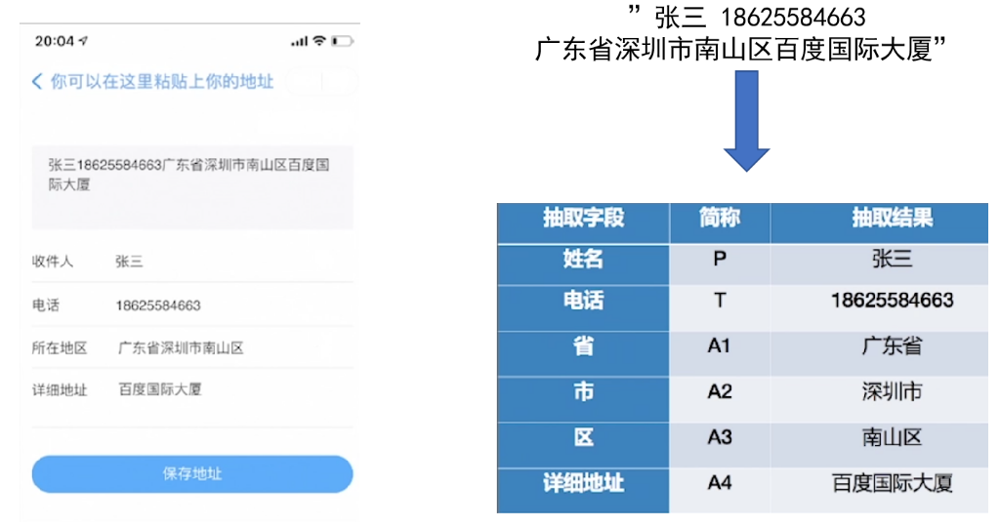

**怎么抽取关键信息？**

- 单独抽取？-- 正则匹配、字典匹配
- 序列整体预测？-- 序列标注模型

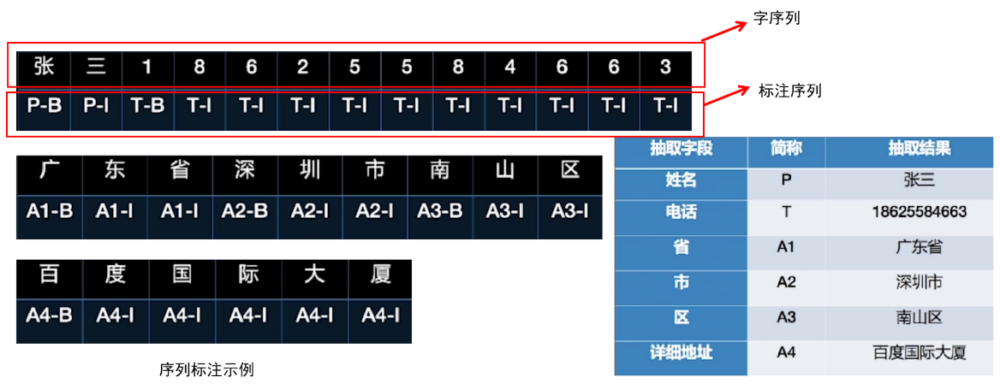

#### 4.1.2 序列标注概念
**什么是序列标注**

- 输入和输出都是序列，单位可以是词或者字
- 输入序列和输出序列是一 一对应的
- 分类问题的一个推广，一种结构化的分类
- 这里输出序列用的是BIO标注体系，BIO 三位标注 (B-begin，I-inside，O-outside)

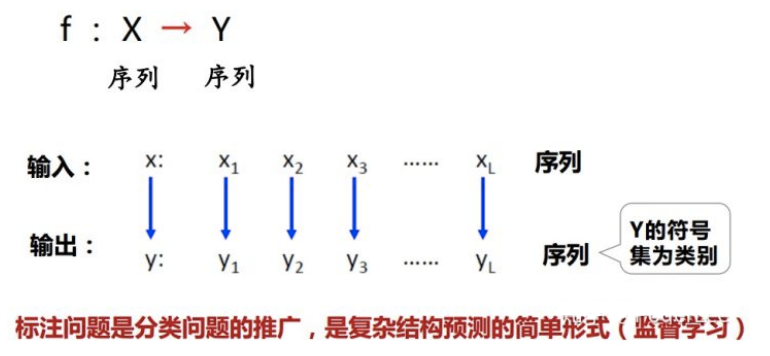

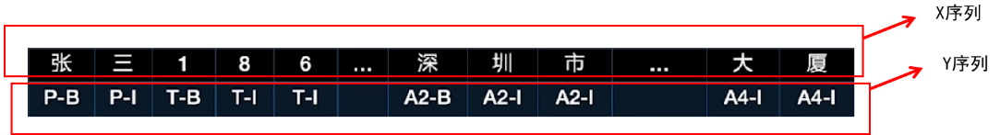

#### 4.1.3 序列标注常见任务
**序列标注应用的常见任务**

很多任务都可以将问题转换为学列标注问题来解决，例如：

- 中文分词（Chinese Word Segmentation）
- 词性标注（Part-of-Speech Tagging）
- 命名实体识别（Named Entity Recognition，NER）
- 文字识别（OCR）
- 语音识别

**中文分词（Chinese Word Segmentation）**

- 中文英文一个重要的区别就是，英文是天然分词的（使用空格或者标点符号），而中文是天然“分字”的，所以中文NLP任务中，分词是一个很基础的任务，大部分任务都是其下游任务。
- 将给定句子切分为具有合理语义的词序列。在分词问题中，序列节点的“词”对应为句子中的每个字，节点的标签空间为{B,M,E,S}。B表示这个字是某个词的开头，M表示这个字是某个词的中间部分，E表示这个字是某个词的结尾，S表示这个字单独成词。每个字最终都会打上对应标签，最终根据标签序列来确定分词结果。

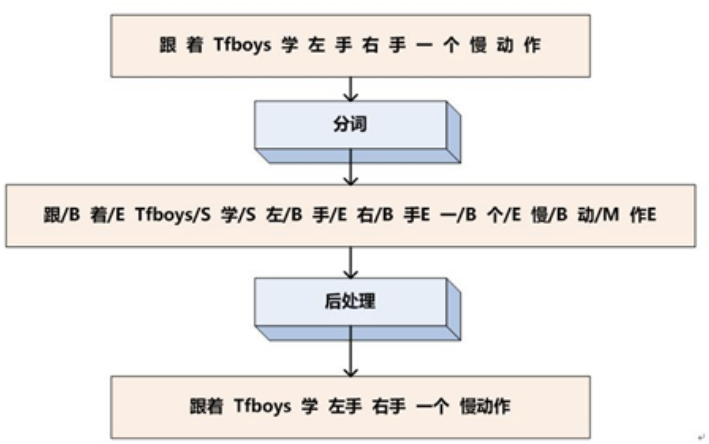  
中文分词过程：字切割--送入分词模型打标签--后处理得到分词结果

**词性标注（Part-of-Speech Tagging）**

- 给定已分词的句子，将句子中的所有词标记词性。这里的“词”对应的就是已分词的词序列中的词，节点的标签空间为词性标记空间如{noun,verb,adj,…}。每个词最终都会打上词性标签
- 分词和词性标注也可以整合成一个模型同时实现

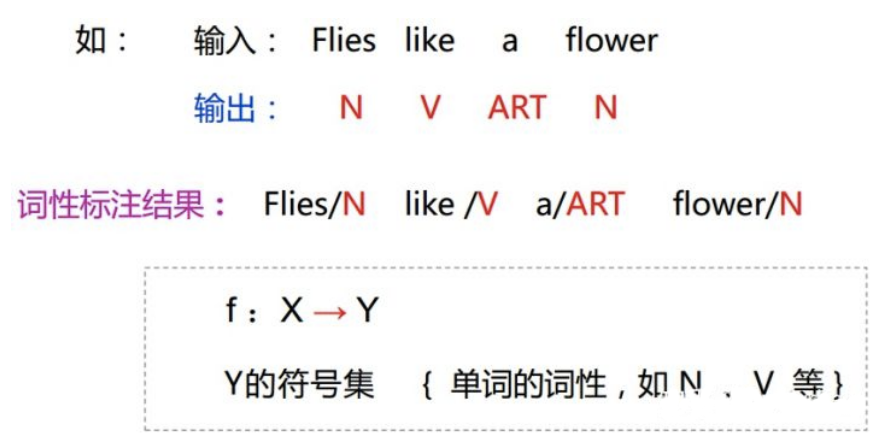  
词性标注过程：词切割--送入标注模型打标签--后处理得到标注结果

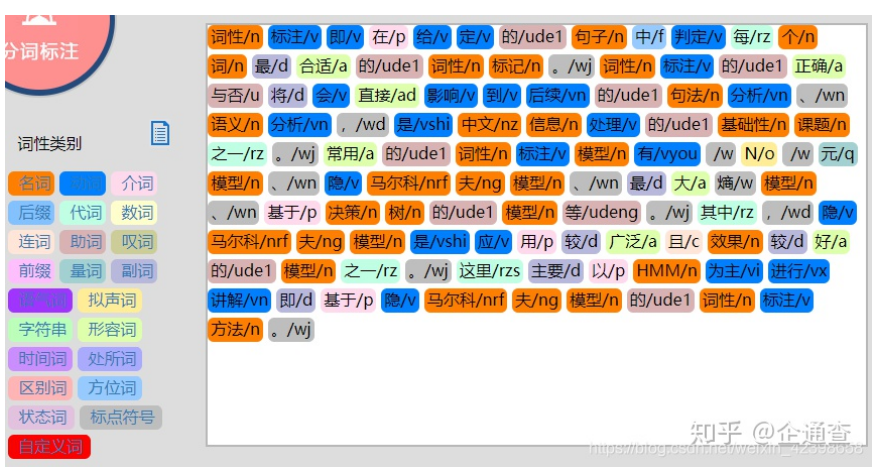  
词性标注结果示例

**命名实体识别（Named Entity Recognition，NER）**

- NER又称作专名识别，是自然语言处理中的一项基础任务，应用范围非常广泛。命名实体一般指的是文本中具有特定意义或者指代性强的实体，通常包括人名、地名、组织机构名、日期时间、专有名词等。NER系统就是从非结构化的输入文本中抽取出上述实体，并且可以按照业务需求识别出更多类别的实体，比如产品名称、型号、价格等。因此实体这个概念可以很广，只要是业务需要的特殊文本片段都可以称为实体。

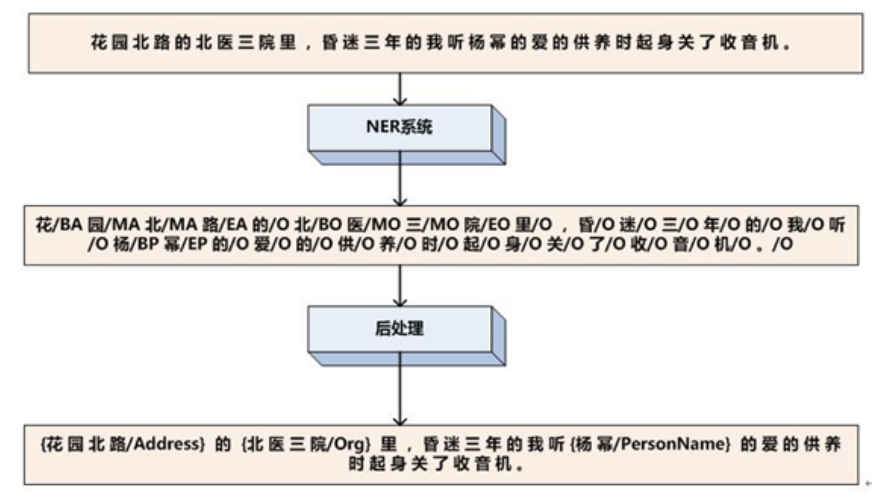  
命名实体识别程：字切割--送入实体识别模型打标签--后处理得到识别结果  
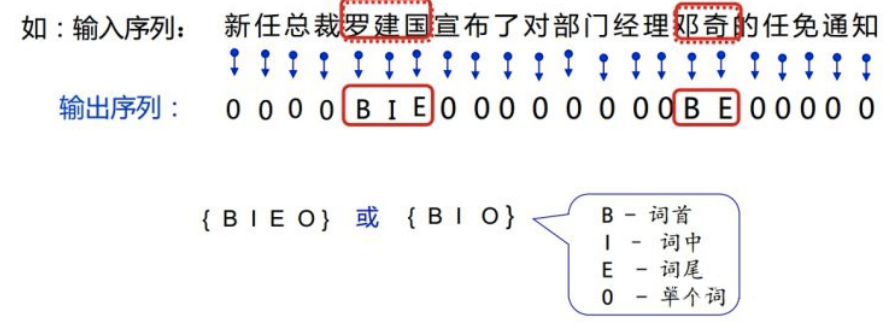  
命名实体识别标注示例

**中文命名实体识别的挑战**

- 中文不像英文那样有空格作为词语的界限标志，而且“词”在中文里本来就是一个很模糊的概念，中文也不具备英文中的字母大小写等形态指示
- 中文的用字灵活多变，有些词语在脱离上下文语境的情况下无法判断是否是命名实体，而且就算是命名实体，当其处在不同的上下文语境下也可能是不同的实体类型
- 命名实体存在大量的嵌套现象，如“北京大学第三医院”这一组织机构名中还嵌套着同样可以作为组织机构名的“北京大学“，这种现象在组织机构名中尤其严重；
- 中文里广泛存在简化表达现象，如”北医三院”、”国科大”，乃至简化表达构成的命名实体，如”国科大桥‘。

#### 4.1.4 标注体系
- BMES 四位序列标注法
    - B表示一个词的词首位值，M表示一个词的中间位置，E表示一个词的末尾位置，S表示一个单独的字词。
- BIO 三位标注 (B-begin，I-inside，O-outside)
    - B-X 代表实体X的开头， I-X代表实体的结尾  O代表不属于任何类型的
- BIOES (B-begin，I-inside，O-outside，E-end，S-single)
    - B 表示开始，I表示内部， O表示非实体 ，E实体尾部，S表示改词本身就是一个实体。

    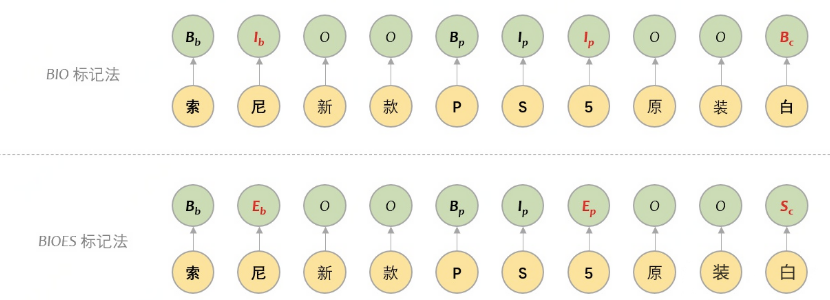

#### 4.1.5 评估指标
- Precision，精确率（查准率）
    - 计算方式：$P = \frac{\text{检出正确的实体个数}}{\text{检出的实体个数}}$
- Recall，召回率(查全率)
    - 计算方式：$R = \frac{\text{检出正确的实体个数}}{\text{真实实体个数}}$
    - 关注模型漏了哪些东西
- F1，综合评价指标：
    - 同时考虑Precision和Recall，两者的调和平均

**计算案例**
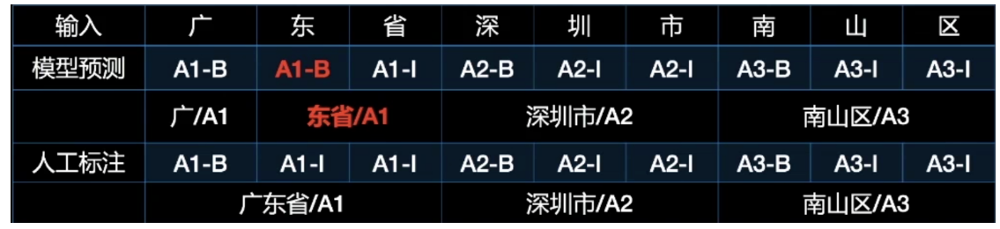

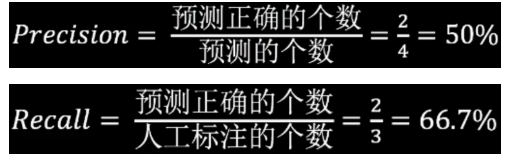

#### 4.1.6 序列标注问题解决方法
**序列标注研究进展**

- 序列标注一直是NLP领域中的研究热点，从早期基于词典和规则的方法，到传统机器学习的方法，到近年来基于深度学习的方法，序列标注研究进展的大概趋势大致如下图所示。

序列标注研究进展的大概趋势  
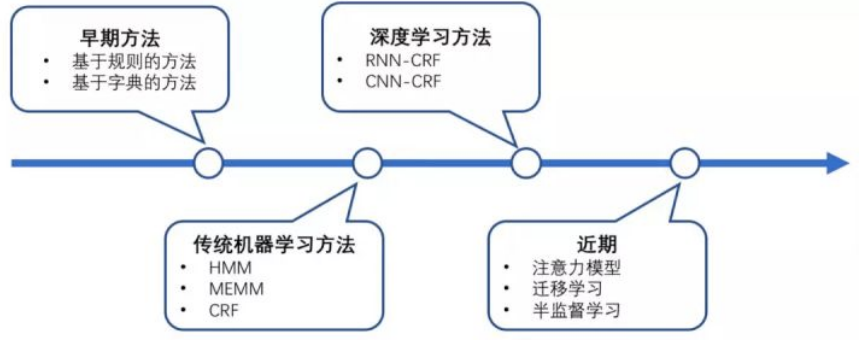  
序列标注研究进展的大概趋势

**传统机器学习方法简介**

- 序列标注任务中的常用机器学习模型包括生成式模型HMM、判别式模型CRF等。
- 条件随机场（ConditionalRandom Field，CRF）是目前的主流模型。
    - 目标函数不仅考虑输入的状态特征函数，而且还包含了标签转移特征函数。
    - CRF的优点在于其为一个位置进行标注的过程中可以利用丰富的内部及上下文特征信息。

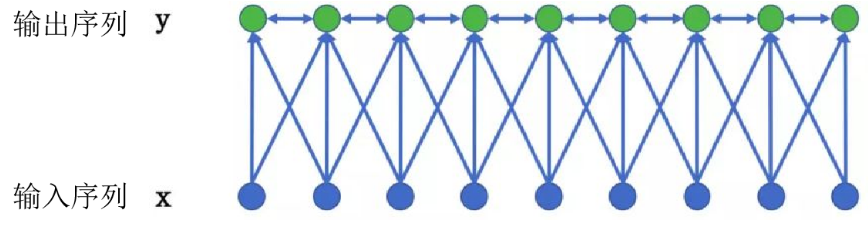

**早期深度学习方法**

近年来，随着硬件计算能力的发展以及词的分布式表示（word embedding）的提出，神经网络可以有效处理许多NLP任务。这类方法对于序列标注任务（如CWS、POS、NER）的处理方式是类似的：

- 将token从离散one-hot表示映射到低维空间中成为稠密的embedding
- 随后将句子的embedding序列输入到RNN中，用神经网络自动提取特征
- Softmax来预测每个token的标签

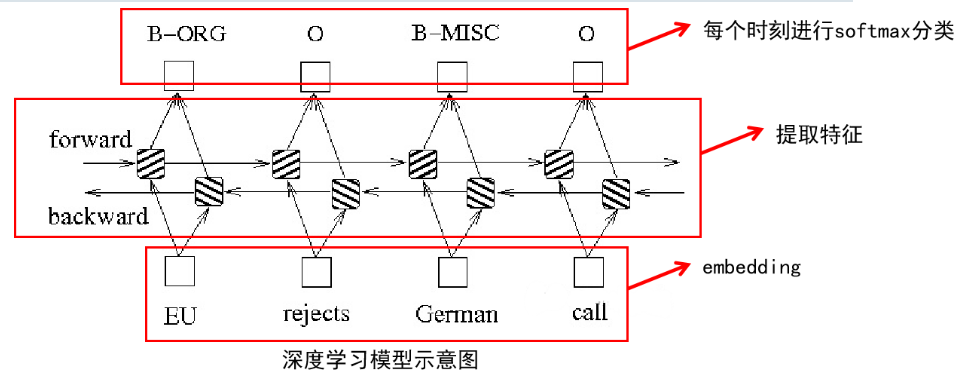

**早期深度学习方法优缺点**

- 优点：这种方法使得模型的训练成为一个端到端的过程，而非传统的pipeline，不依赖于特征工程，是一种数据驱动的方法。
- 缺点：
    - 网络种类繁多、对参数设置依赖大，模型可解释性差。
    - 对每个token打标签的过程是独立的进行，不能直接利用上文已经预测的标签（只能靠隐含状态传递上文信息），进而导致预测出的标签序列可能是无效的，例如标签I-PER后面是不可能紧跟着B-PER的，但Softmax不会利用到这个信息。

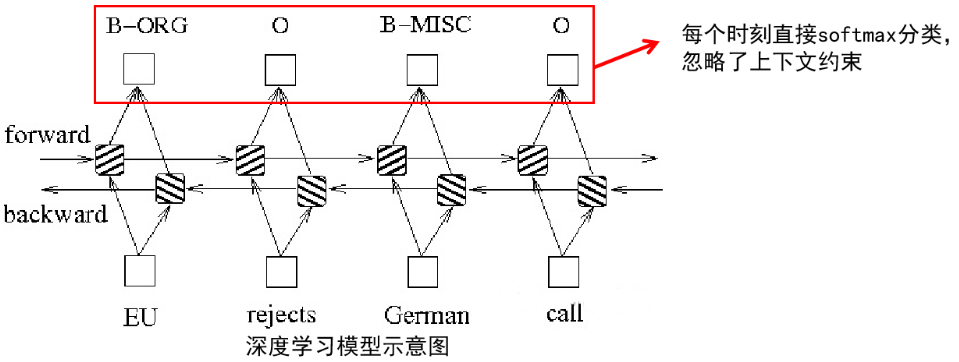

**改进的深度学习方法**

为了解决softmax的问题，学界提出了DL-CRF模型做序列标注。在神经网络的输出层接入CRF层(重点是利用标签转移概率)来做句子级别的标签预测，使得标注过程不再是对各个token独立分类。

- BiLSTM-CRF（RNN base）
- IDCNN-CRF（CNN base）

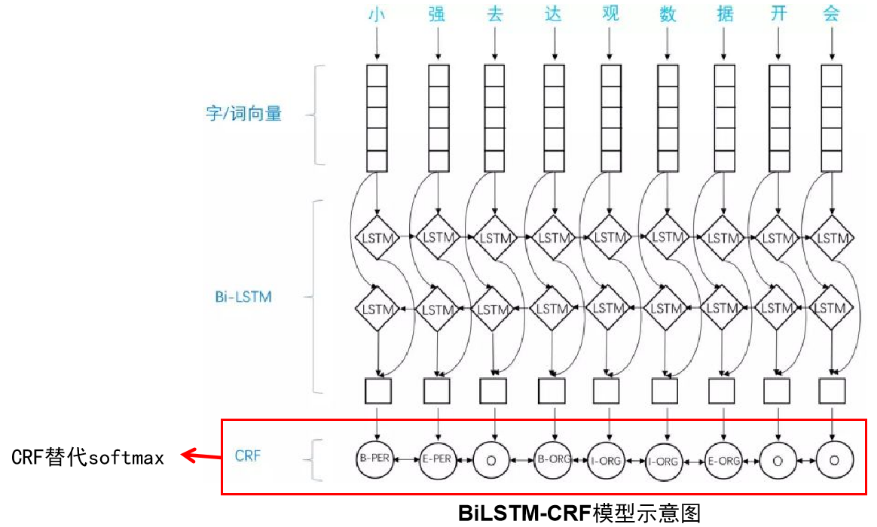

#### 4.1.7 标注工具
**常用的标注工具：**

- Brat http://brat.nlplab.org/ 使用较为广泛
- Chinese-Annotator https://github.com/deepwel/Chinese-Annotator
- YEDDA https://github.com/jiesutd/YEDDA
- Prodigy https://prodi.gy/docs/

**Brat标注工具使用：**

- 1.登录后，选中文本后会弹出窗口，选择实体类型
- 2.拖动标注好的实体可以连接关系
- 3.双击标签可对标签进行修改或删除
- 4.点击data可导出标注好的数据

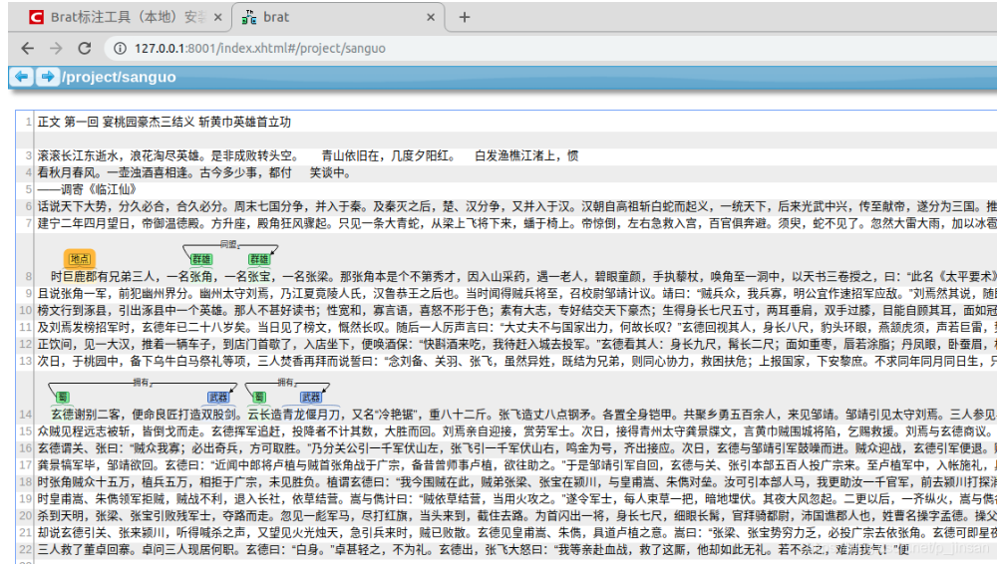

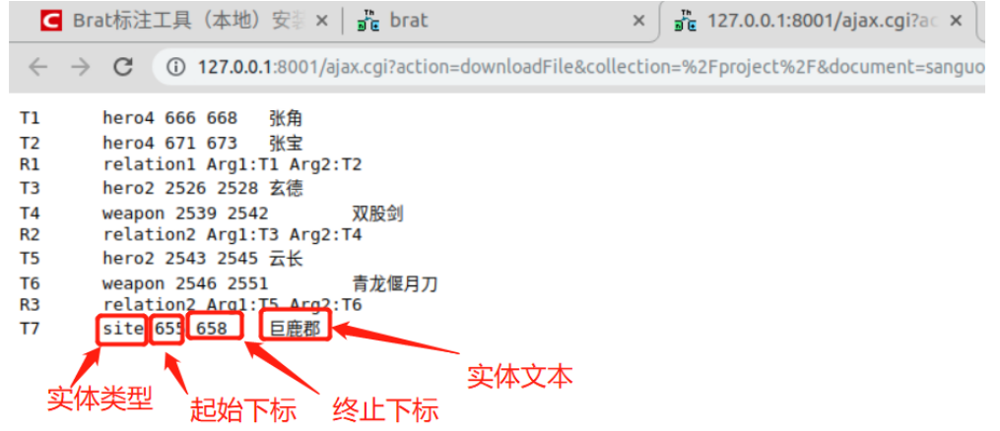

### 4.2 统计学模型
#### 4.2.1 统计学模型
**传统统计学序列标注模型：**

序列标注任务中的常用机器学习模型包括：

- 生成式模型HMM
- 判别式模型MEMM
- 判别式模型CRF

#### 4.2.2 隐马尔科夫模型（HMM）实现序列标注
**隐马尔可夫模型（Hidden Markov Model，HMM）：**

- NER本质上可以看成是一种序列标注问题（预测每个字的BIOES标记），在使用HMM解决NER这种序列标注问题的时候，我们所能观测到的是字组成的序列（观测序列X），观测不到的是每个字对应的标注（状态序列Y）
- 思考自然语言生成的过程：
    - 首先在第一步，基于语法（转移概率矩阵）我们产生一个词性序列Y；
    - 第二步我们基于一个字典，根据经验（发射概率）产生一个基于词性语句的实际语句X。

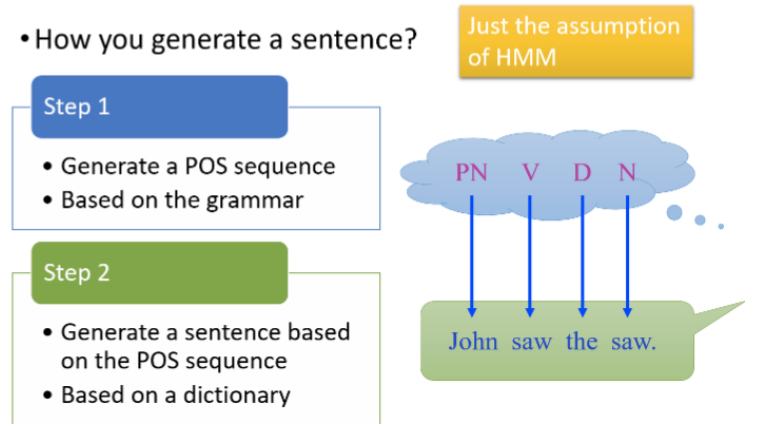  
自然语言生成过程

**隐马尔可夫生成过程：**

1.具体来讲，HMM的第一步如下图所示：  
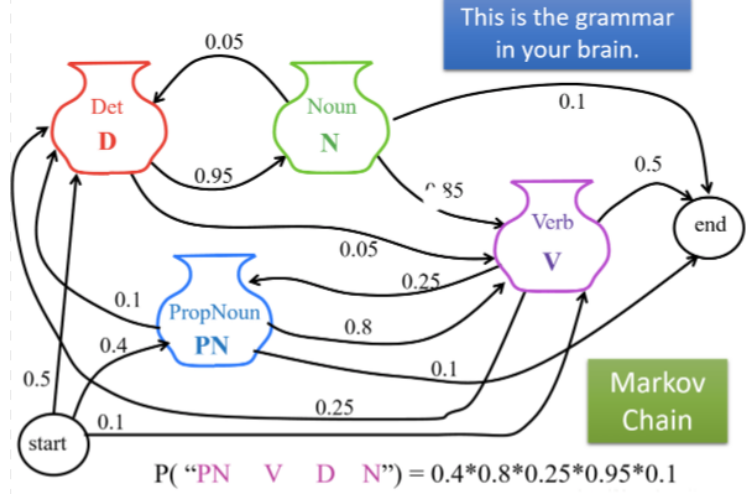  
- 在这里生成的每一个句子都是从 start 开始，然后沿着他的路径以某一个概率到达下一个点，直到到达最后的 end。这样我们就产生了第一个词性语句（PN V D N），同时我们可以计算产生这种词性语句的概率。
$P(\text{PN V D N}) = P(\text{PN} \mid \text{start}) \cdot P(\text{V} \mid \text{PN}) \cdot P(\text{D} \mid \text{V}) \cdot P(\text{N} \mid \text{D}) \cdot P(\text{end} \mid \text{N}) = 0.4 \times 0.8 \times 0.25 \times 0.95 \times 0.1$

2.第二步中，根据产生的词性语句，可以有字典产生对应单词构成语句，如下图所示  
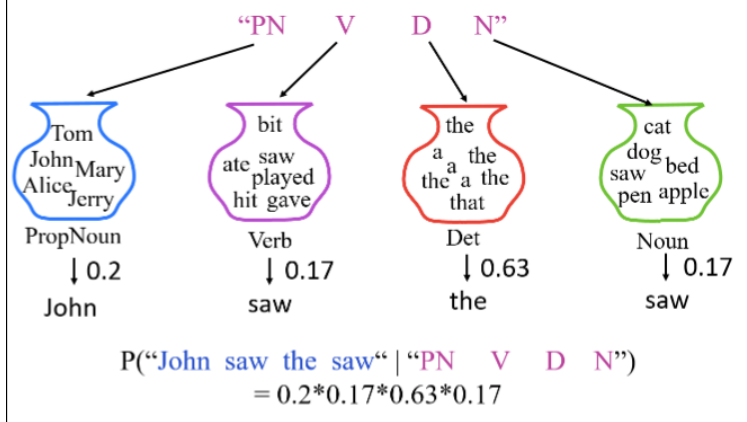  
$P(\text{PN} \mid \text{start}) \cdot P(\text{V} \mid \text{PN}) \cdot P(\text{D} \mid \text{V}) \cdot P(\text{N} \mid \text{D}) \cdot P(\text{end} \mid \text{N}) =0.2 \times 0.17 \times 0.63 \times 0.17$

3.如何计算联合概率P(x,y)：
- 词性与单词同时出现的概率如图所示，可以利用条件概率进行计算，其中产生 p(y) 的概率的计算过程可以看作是一系列的条件概率相乘；而 p(x∣y) 的概率的计算过程如图所示，计算完这两个部分就可以计算联合概率 p(x,y)  
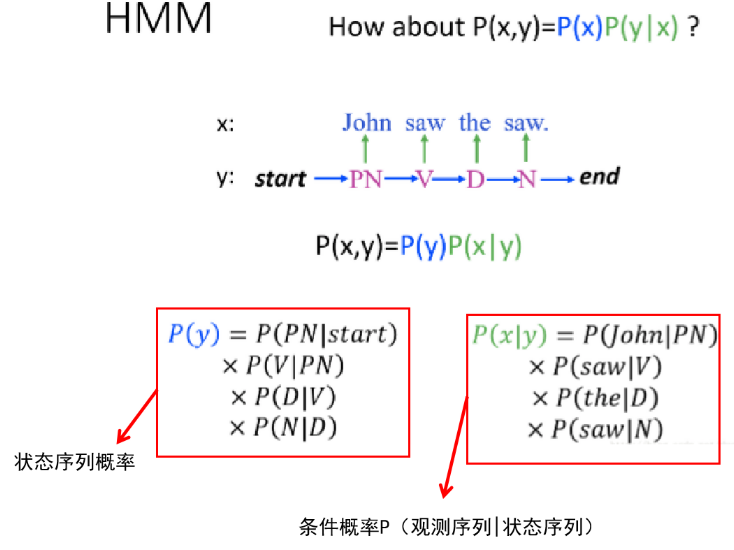

**隐马尔可夫模型：**

我们将两个过程概述为如下的形式

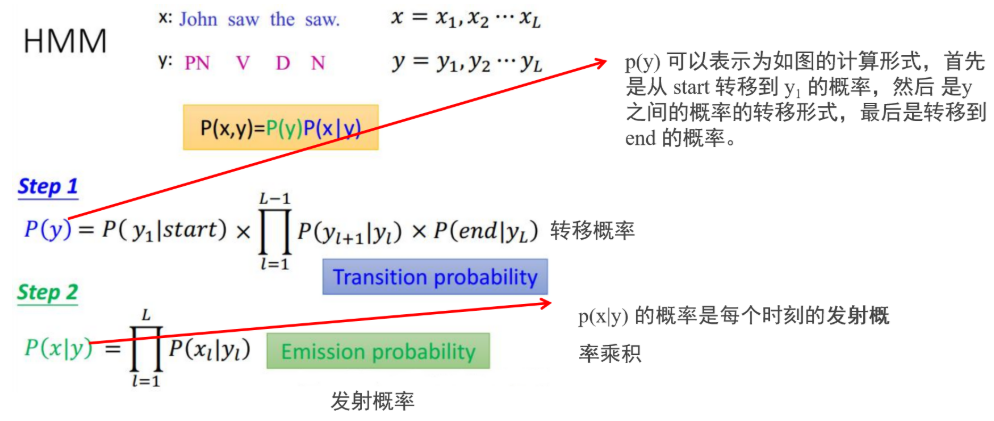

**隐马尔可夫模型如何求解：**

虽然我们知道计算的过程可以使用上面的那种形式，但是其中的每一项又是如何计算的呢？实际上是在训练数据中得到的，具体如下图所示:  
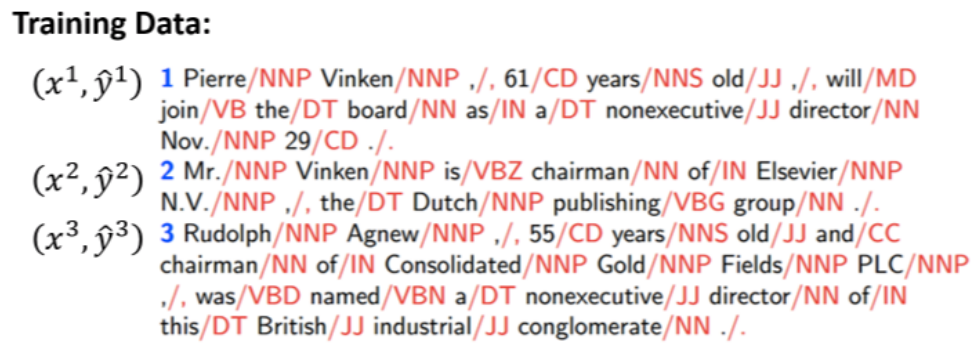  
语言学家对训练数据中的每一单词的词性进行标注

我们需要在训练数据中统计两种概率：

- 转移概率：比如说: $P(\text{V} \mid \text{PN}),\; P(\text{PN} \mid \text{start})$
- 发射概率：比如说: $P(\text{saw} \mid \text{V}) \cdot P(\text{the} \mid \text{D})$

**隐马尔可夫模型概率训练过程：**

现在回过头来看整个训练过程的计算如下：

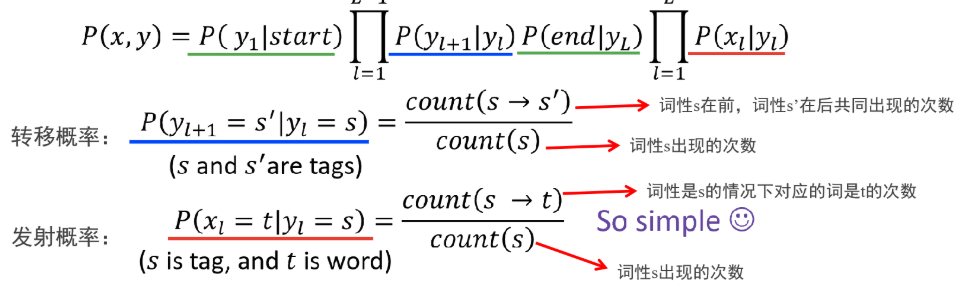

**隐马尔可夫模型预测过程：**

那如何在给定了输入x的时候完成词性标注y呢？

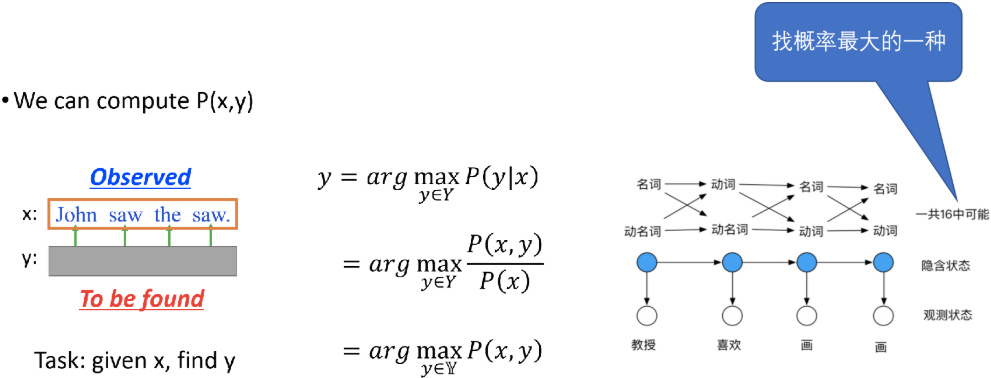  
如上图所示，这个时候我们的任务就是给定一个输入的句子 x ，希望得到句子中每一个单词的词性 y , 这里通过上述的方法计算，其中标签应该是在给定输入时使这个后验概率最大的 y 的值，我们可以将条件概率写成联合概率与 P(x) 的除法的形式。因为在这里我们是给定的 x , ，所以他最后等价于寻找使得联合概率最大的 y 。

#### 4.2.5 HMM实现词性标注(关注这段代码)
##### 1.实现HMM

In [2]:
# hmmlearn
import numpy as np
from collections import defaultdict
class HMM(object):
    def __init__(self, min_count=5):
        """Args:
            min_count:过滤词频比较小的词
        """
        self.min_count = min_count

    def train(self, word_lists, tag_lists):
        """HMM的训练，即根据训练语料对模型参数进行估计,
           因为我们有观测序列以及其对应的状态序列，所以我们
           可以使用极大似然估计的方法来估计隐马尔可夫模型的参数
        参数:
            word_lists: 列表，其中每个元素由字组成的列表，如 ['担','任','科','员']
            tag_lists: 列表，其中每个元素是由对应的标注组成的列表，如 ['O','O','B-TITLE', 'E-TITLE']
        """
        # 输入词序列长度和输出标签序列长度必须相等
        assert len(tag_lists) == len(word_lists)

        vocab = defaultdict(int)
        tags = defaultdict(int)
        for s, p in zip(word_lists, tag_lists): # 统计词频，标签概率
            for w, t in zip(s, p):
                vocab[w] += 1 # 统计词频
                tags[t] += 1 # 统计词性的频率
        # 过滤最小词频
        vocab = { k:v for k, v in vocab.items() if v>=self.min_count}
        vocab = sorted(vocab.items(), key=lambda x:x[1], reverse=False) # 按照词频降序排序
        tags = sorted(tags.items(), key=lambda x:x[1], reverse=False) # 词性频率降序排列
        self.word2id = {k:i+1 for i, (k, v) in enumerate(vocab)} # 转成字典
        self.word2id['<unk>'] = 0 # 未登录词，解决未登录词的问题
        self.tag2id = {k:i for i, (k, v) in enumerate(tags)}
        self.id2tag = {v:k for k, v in self.tag2id.items()}
        # 处理数据将词映射成id
        word_lists = [[self.word2id[w] if w in self.word2id.keys() else self.word2id['<unk>'] for w in s] for s in word_lists]
        tag_lists = [[self.tag2id[t] for t in p] for p in tag_lists]
        self.N = len(self.tag2id) # N:状态数,这里对应存在的标注的种类
        self.M = len(self.word2id) # M:观测数,这里对应有多少不同的词
        # 状态转移概率矩阵Aij表示从i状态转移到状态j的概率
        self.A = np.zeros([self.N, self.N])
        # 观测概率矩阵,Bij表示i状态下生成j观测的概率
        self.B=np.zeros([self.N, self.M])
        #初始状态檄率Pi装示初始时刻为状态i的概室
        self.Pi=np.zeros(self.N)

        # 估计转移概率矩阵
        for tag_list in tag_lists:
            seq_len = len(tag_list) # 序列长度
            for i in range(seq_len - 1):
                current_tagid = tag_list[i] # 获取当前标签id
                next_tagid = tag_list[i+1] # 获取下个时刻标签id
                self.A[current_tagid][next_tagid] += 1 # 频率+1
        # 问题：如果某元素没有出现过，该位置为0，这在后续的计算中是不允许的
        # 解决方法：我们将等于0的概率加上很小的数   
        self.A[self.A == 0.] = 1e-10 # 概率不能为0，用一个极小数，平滑技术
        self.A = self.A / self.A.sum(axis=1, keepdims=True) # p(a, b)/p(a)

        for tag_list, word_list in zip(tag_lists, word_lists):
            assert len(tag_list) == len(word_list)
            for tag, word in zip(tag_list, word_list):
                self.B[tag][word] += 1
        self.B[self.B == 0.] = 1e-10
        self.B = self.B / self.B.sum(axis=1, keepdims=True)

        # 估计初始状态概率
        for tag_list in tag_lists:
            init_tagid = tag_list[0] # 取出每个句子一个词性
            self.Pi[init_tagid] += 1
        self.Pi[self.Pi == 0.] = 1e-10
        self.Pi = self.Pi / self.Pi.sum()
    
    def predict(self, word_lists):
        word_lists = [[self.word2id[w] if w in self.word2id.keys() else self.word2id['<unk>'] for w in s] for s in word_lists]
        pred_tag_lists = []
        for word_list in word_lists:
            pred_tag_list = self.decoding(word_list)
            pred_tag_lists.append(pred_tag_list)
        return pred_tag_lists

    def decoding(self, word_list):
        """
        使用维特比算法对给定观测序列求状态序列， 这里就是对字组成的序列,求其对应的标注。
        维特比算法实际是用动态规划解隐马尔可夫模型预测问题，即用动态规划求概率最大路径（最优路径）
        这时一条路径对应着一个状态序列
        """
        # 问题:整条链很长的情况下，十分多的小概率相乘，最后可能造成下溢
        # 解决办法：采用对数概率，这样源空间中的很小概率，就被映射到对数空间的大的负数
        #  同时相乘操作也变成简单的相加操作
        A = np.log(self.A)
        B = np.log(self.B)
        Pi = np.log(self.Pi)

        # 初始化 维比特矩阵viterbi 它的维度为[状态数, 序列长度]
        # 其中viterbi[i, j]表示标注序列的第j个标注为i的所有单个序列(i_1, i_2, ..i_j)出现的概率最大值
        seq_len = len(word_list)
        viterbi = np.zeros([self.N, seq_len])
        # backpointer是跟viterbi一样大小的矩阵
        #  backpointer[i, j]存储的是 标注序列的第j个标注为i时，第j-1个标注的id
        # 等解码的时候，我们用backpointer进行回溯，以求出最优路径
        backpointer = np.zeros([self.N, seq_len], dtype=np.int32)

        # self.Pi[i] 表示第一个字的标记为i的概率
        # Bt[word_id]表示字为word_id的时候，对应各个标记的概率
        # self.A.t()[tag_id]表示各个状态转移到tag_id对应的概率
        # 所以第一步
        start_wordid = word_list[0]
        Bt = B.T
        bt = Bt[start_wordid] # 一列⬇
        viterbi[:, 0] = Pi + bt # 0列全部加Pi概率
        backpointer[:, 0] = -1

        # 递推公式：
        # viterbi[tag_id, step] = max(viterbi[:, step-1]* self.A.t()[tag_id] * Bt[word])
        # 其中word是step时刻对应的字
        # 由上述递推公式求后续各步
        for step in range(1, seq_len):
            wordid = word_list[step]
            # 处理字不在字典中的情况
            # bt是在t时刻字为wordid时，状态的概率分布
            if wordid == self.word2id.get('<unk>', 0):
                # 对于未登录词，我们认为它由任何状态生成的概率都是均等的
                bt = np.log(np.ones(self.N) / self.N)
            else:
                bt = Bt[wordid] # 否则从观测概率矩阵中取bt
            
            # for tag_id in range(len(self.tag2id)):
            #     max_prob= np.max(
            #         viterbi[:, step-1] + A[:, tag_id],
            #         axis=0
            #     )
            #     max_id=np.argmax(
            #         viterbi[:, step-1] + A[:, tag_id],
            #         axis=0
            #     )
            # ⬆for也可以，这里使用广播机制改进，速度更快，一行代码⬇
            # viterbi[:, step-1] 维度是 (N,) -> 变形成 (N, 1)
            # A 的维度是 (N, N)，表示 (上一个状态, 当前状态)
            # 相加后维度变为 (N, N)，每一列代表向某个当前状态转移的所有可能得分
            score_matrix = viterbi[:, step-1].reshape(-1, 1) + A
            # 沿着 axis=0 (即上一个状态的维度) 求最大值，直接得到维度为 (N,) 的结果
            max_prob = np.max(score_matrix, axis=0)
            max_id = np.argmax(score_matrix, axis=0)

            viterbi[:, step] = max_prob + bt
            backpointer[:, step] = max_id

        # 终止， t=seq_len 即 viterbi[:, seq_len]中的最大概率，就是最优路径的概率
        best_path_prob= np.max(
            viterbi[:, seq_len-1], axis=0
        )
        best_path_pointer= np.argmax(
            viterbi[:, seq_len-1], axis=0
        )

        # 回溯，求最优路径
        best_path_pointer = best_path_pointer.item()
        best_path = [best_path_pointer]
        for back_step in range(seq_len - 1, 0, -1):
            best_path_pointer = backpointer[best_path_pointer, back_step]
            best_path_pointer = best_path_pointer.item()
            best_path.append(best_path_pointer)

        # 将tag_id组成的序列转化为tag
        assert len(best_path) == len(word_list)

        tag_list = [self.id2tag[id_] for id_ in reversed(best_path)]

        return tag_list

##### 2. 加载训练集

In [1]:
import json
filename = 'Dataset/pos/pos_train.json' # 训练数据文件，存储一个列表的句子，一个句子是一个（词，词性）对
print("开始加载数据.....")
with open(filename, encoding='utf-8') as f:
    train_sents = json.load(f)
train_sentences = []
train_pos = []
for sent in train_sents:
    s = []
    p = []
    for w in sent:
        s.append(w[0])
        p.append(w[1])
    train_sentences.append(s)
    train_pos.append(p)
print(train_sentences[:2], train_pos[:2])

开始加载数据.....
[['必须', '指出', '，', '"', '长期', '共存', '、', '互相', '监督', '"', '的', '方针', '是', '我党', '既定', '的', '政策', '，', '至于', '各', '民主党派', '是否', '能够', '长期', '存在', '下去', '，', '这', '不是', '由', '共产党', '一方面', '的', '愿望', '所', '决定', '，', '还要', '看', '各', '民主党派', '自己', '的', '表现', '，', '看', '它们', '是不是', '诚心诚意', '地', '接受', '共产党', '的', '领导', '、', '走', '社会主义', '道路', '来', '决定', '，', '这', '是', '实现', '长期', '共存', '的', '根本', '条件', '。'], ['金院本', '作品', '今', '亦', '不', '存', '，', '但', '从', '《', '院本', '名目', '》', '看', '，', '全部', '袭用', '其它', '艺术', '样式', '的', '名目', '几乎', '减', '得', '不', '剩', '几个', '，', '而', '"', '引', '首', '"', '、', '"', '艳', '段', '"', '、', '"', '栓', '搐', '"', '等', '形式', '则', '明显', '增多', '，', '日趋', '重要', '；', '更', '值得', '注意', '的', '是', '"', '院', '幺', '"', '形式', '把', '说唱', '故事', '与', '滑稽', '表演', '糅合', '到', '一起', '，', '使', '戏曲', '特点', '表现', '得', '更', '突出', '。']] [['d', 'v', 'w', 'w', 'nt', 'v', 'w', 'd', 'v', 'w', 'u', 'n', 'vl', 'n', 'a', 'u', 'n', 'w', 'v', 'r', 'n', 'd', 'vu', 'nt', 'v', 'vd', 'w', 'r'

##### 3. 训练HMM 模型

In [3]:
hmm = HMM()
hmm.train(train_sentences, train_pos)

##### 4.HMM预测

In [4]:
filename = 'Dataset/pos/pos_test.json'#训练数据文件，存储一个列表的句子，一个句子是一个（词，词性）对
print("开始加载测试数据.....")
with open(filename,encoding='utf-8') as f:
    train_sents = json.load(f)
sentences = []
pos = []
for sent in train_sents:
    s = []
    p = []
    for w in sent:
        s.append(w[0])
        p.append(w[1])
    sentences.append(s)
    pos.append(p)

开始加载测试数据.....


In [6]:
# 测试
y_pred = hmm.predict(sentences[:2])
result = [[ w+'/'+p+'/'+t for w, p, t in zip(sent, y_p, pos)] for sent, y_p, pos in zip(sentences[:2], y_pred, pos[:2])]
print("结果(词/预测词性/真实词性/)：" ,result)

结果(词/预测词性/真实词性/)： [['必须/d/d', '指出/v/v', '，/w/w', '"/w/w', '长期/nt/nt', '共存/v/v', '、/w/w', '互相/d/d', '监督/v/v', '"/w/w', '的/u/u', '方针/n/n', '是/vl/vl', '我党/n/n', '既定/a/a', '的/u/u', '政策/n/n', '，/w/w', '至于/p/v', '各/r/r', '民主党派/n/n', '是否/d/d', '能够/vu/vu', '长期/nt/nt', '存在/v/v', '下去/vd/vd', '，/w/w', '这/r/r', '不是/vl/vl', '由/p/p', '共产党/n/n', '一方面/n/n', '的/u/u', '愿望/n/n', '所/u/u', '决定/v/v', '，/w/w', '还要/vu/vu', '看/v/v', '各/r/r', '民主党派/n/n', '自己/r/r', '的/u/u', '表现/n/n', '，/w/w', '看/v/v', '它们/r/r', '是不是/v/v', '诚心诚意/i/i', '地/u/u', '接受/v/v', '共产党/n/n', '的/u/u', '领导/n/n', '、/w/w', '走/v/v', '社会主义/n/n', '道路/n/n', '来/vd/vd', '决定/v/v', '，/w/w', '这/r/r', '是/vl/vl', '实现/v/v', '长期/nt/nt', '共存/v/v', '的/u/u', '根本/a/a', '条件/n/n', '。/w/w'], ['金院本/nh/n', '作品/n/n', '今/nt/nt', '亦/d/d', '不/d/d', '存/v/v', '，/w/w', '但/c/c', '从/p/p', '《/w/w', '院本/v/n', '名目/n/n', '》/w/w', '看/v/v', '，/w/w', '全部/n/n', '袭用/v/v', '其它/r/r', '艺术/n/n', '样式/n/n', '的/u/u', '名目/n/n', '几乎/d/d', '减/v/v', '得/u/u', '不/d/d', '剩/v/v', '几个/mq/mq', '，/w/w

#### 4.2.3 最大熵模型MEMM
**最大熵模型：**

- HMM在完成序列标注任务时，并不能结合上下文信息，因此我们必须寻求一种新的方式克服这一缺点，即最大熵模型

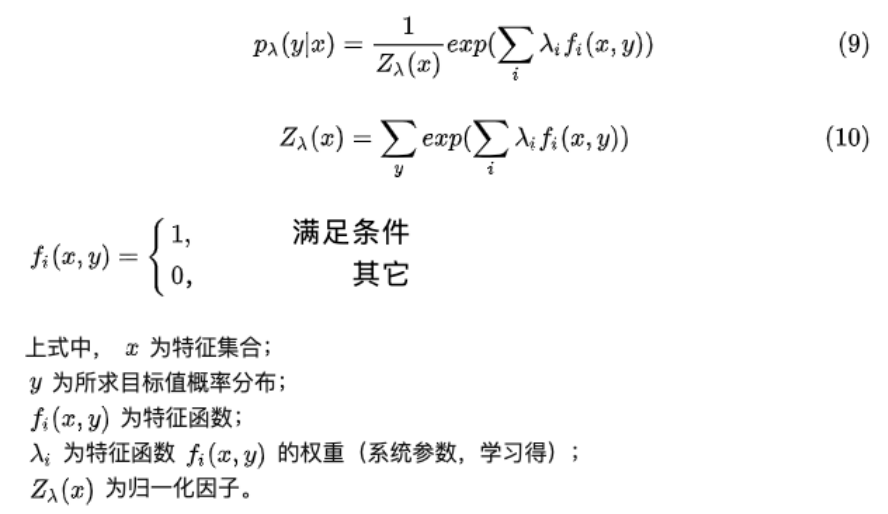

**这里我们以健康评估为例说明最大熵模型在此的应用。定义特征集合**

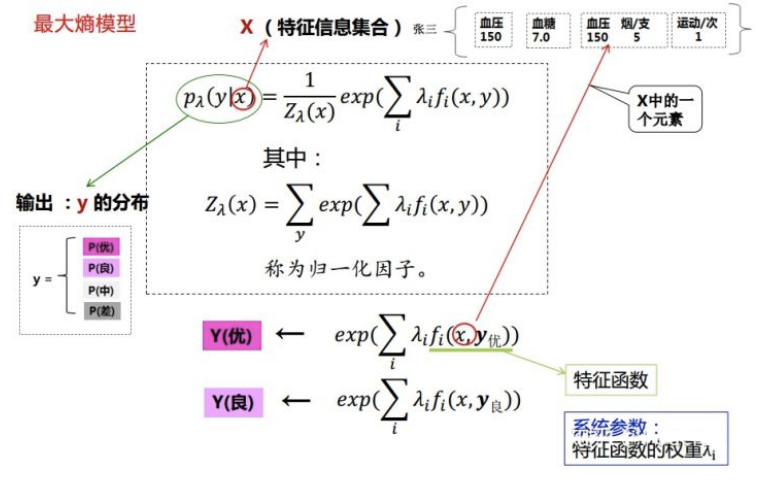

#### 4.2.4 条件随机场（CRF）实现序列标注
**条件随机场：**

条件随机场模型如图所示：

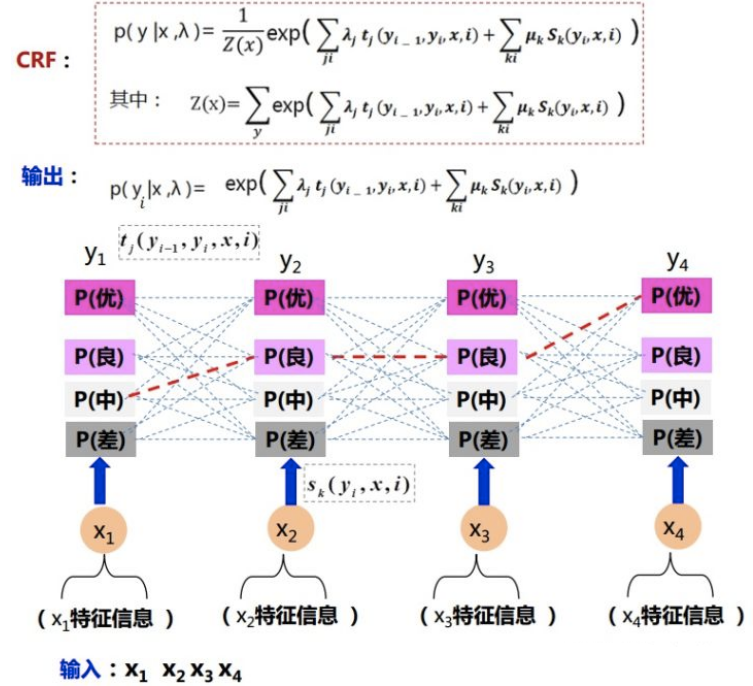  
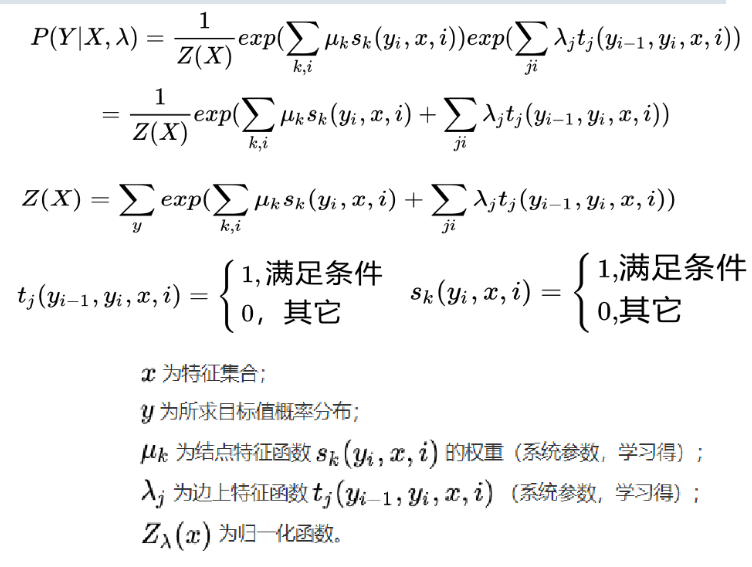

### 4.3 深度学习模型
#### 4.3.1 深度学习模型
在序列标注的深度学习模型中，基本都会在输出层后接入CRF层(重点是利用标签转移概率)来做句子级别的标签预测，使得标注过程不再是对各个token独立分类，这样可以避免出现不规范的预测结果问题。主流的模型有：

- BiLSTM-CRF（RNN base）
- IDCNN-CRF（CNN base）
- Bert+BiLSTM-CRF

#### 4.3.2 BiLSTM-CRF
**BiLSTM-CRF模型架构：**

- 句中的每个单词是一条包含字嵌入的字向量，字嵌入通常是事先训练好的，并且会在训练迭代过程中被调整。
- BiLSTM的输入是字嵌入向量，输出是每个字对应的tag预测分值
- CRF输入的tag预测分值，通过学习一个转移概率矩阵对预测标签进行约束

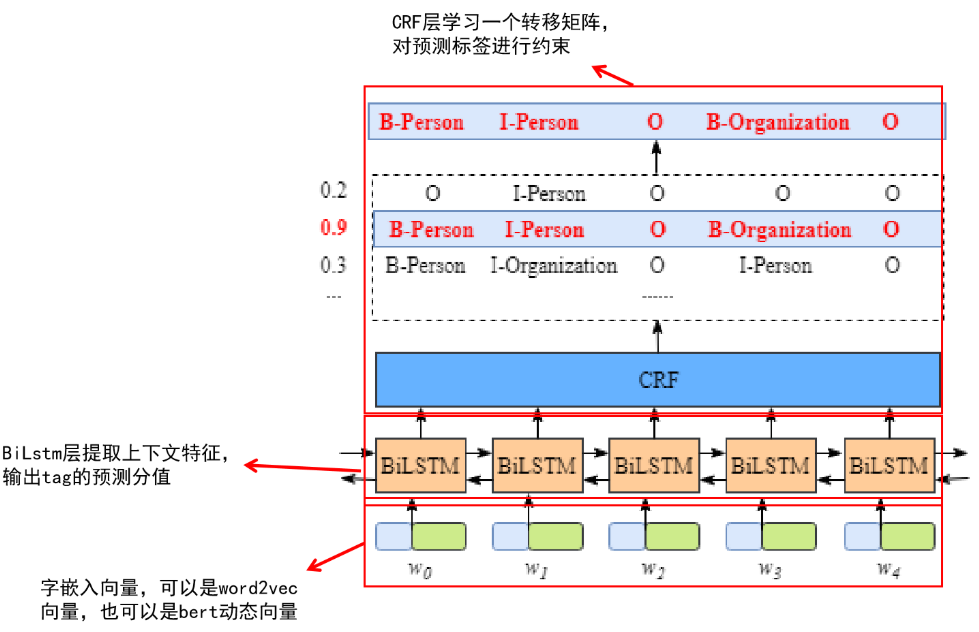

**BiLSTM层的输出：**

- 尽管不需要了解BiLSTM的实现细节，但为了更好的理解CRF层，我们还是需要知道一下BiLSTM的输出到底是什么意思

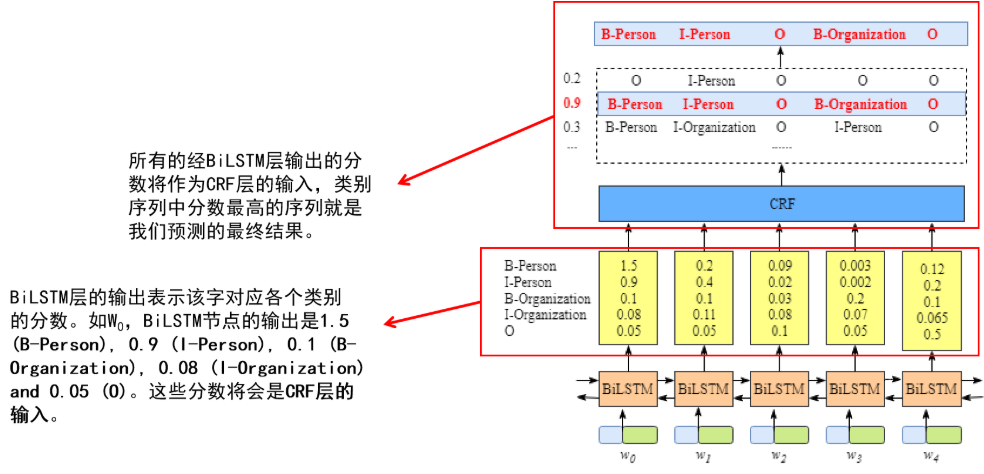

**如果没有CRF层会是什么样：**

- 即使没有CRF层，我们照样可以训练一个基于BiLSTM的命名实体识别模型，如图所示：

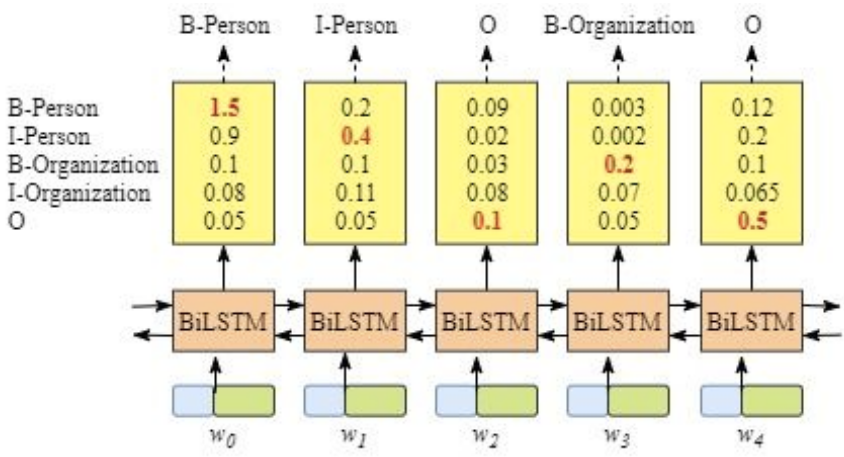  
因为BiLSTM模型的结果是单词对应各类别的分数（Score），我们可以选择分数最高的类别作为预测结果。如W0，“B-Person”的分数最高（1.5），那么我们可以选定“B-Person”作为预测结果。同样的，w1是“I-Person”, w2是“O”,w3是 “B-Organization” ，w4是 “O”。

- 尽管我们在该例子中得到了正确的结果，但实际情况并不总是这样。来看下面的例子

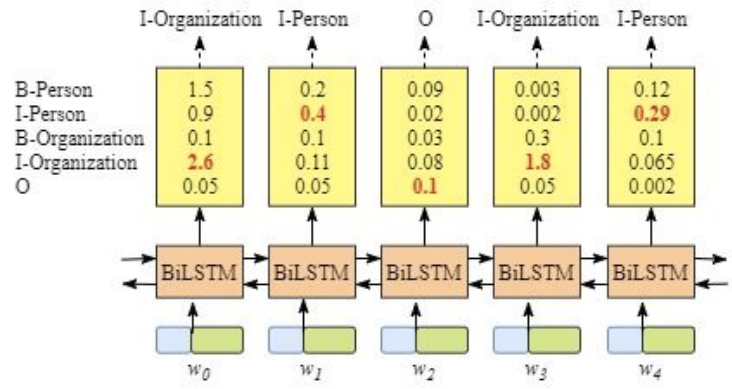

显然，这次的分类结果并不准确。

因为BiLstm模型并不能保证规则约束问题：

- I不能开头
- 前后实体类型应该一致

**CRF层可以学习到句子的约束条件**

CRF层可以加入一些约束来保证最终预测结果是有效的。这些约束可以在训练数据时被CRF层自动学习得到。可能的约束条件有：

- 句子的开头应该是“B-”或“O”，而不是“I-”。
- “B-label1 I-label2 I-label3…”，在该模式中，类别1,2,3应该是同一种实体类别。比如，“B-Person I-Person” 是正确的，而“B-Person I-Organization”则是错误的。
- “O I-label”是错误的，命名实体的开头应该是“B-”而不是“I-”。

有了这些有用的约束，错误的预测序列将会大大减少。

#### 4.3.3 CRF损失函数
**CRF损失函数定义**

- CRF损失函数由真实路径得分和所有可能路径的总得分组成。
- 在所有可能的路径中，真实路径的得分应该是最高的。

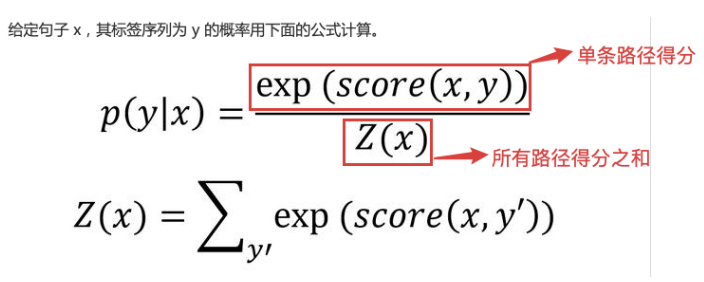

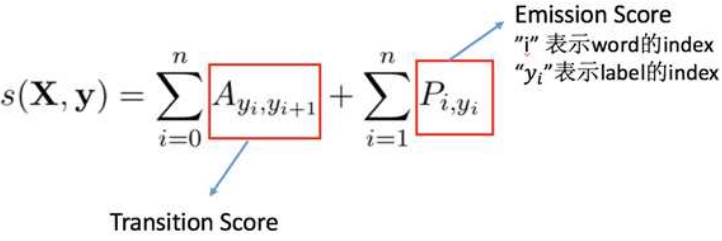

**CRF损失函数理解**

例如，我们的数据集中有如下几种类别：

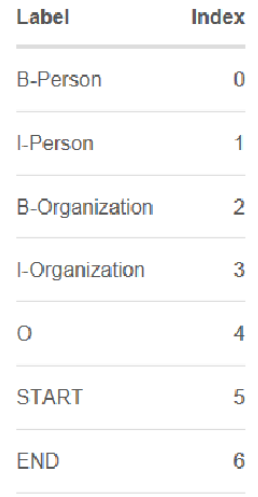

一个包含5个单词的句子，可能的类别序列如下：

- 1.START B-Person B-Person B-Person B-Person B-Person END
- 2.START B-Person I-Person B-Person B-Person B-Person END…..
- 10.START B-Person I-Person O B-Organization O END
- ...

每种可能的路径的分数为Pi，共有N条路径，则路径的总分是：
$$P_{\text{total}} = P_1 + P_2 + \cdots + P_N = e^{S_1} + e^{S_2} + \cdots + e^{S_N}$$
如果第十条路径是真实路径，也就是说第十条是正确预测结果，那么第十条路径的分数应该是所有可能路径里得分最高的。

**CRF损失函数训练目标**

根据如下损失函数，在训练过程中，BiLSTM-CRF模型的参数值将随着训练过程的迭代不断更新，使得真实路径所占的比值越来越大

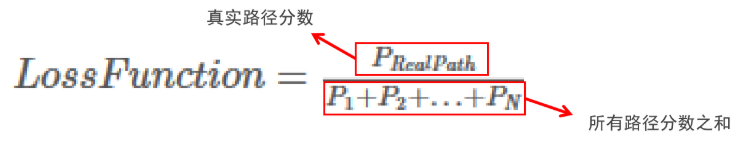

现在的问题是:

- 怎么定义路径的分数？
- 怎么计算所有路径的总分？
- 当计算所有路径总分时，是否需要列举出所有可能的路径？（答案是不需要）

**CRF路径分数定义**

CRF层中计算预测序列的分数包括两种类型的分数，而理解这两类分数的计算是理解CRF的关键。

- Emission Score：发射分数
- Transition Score：转移分数

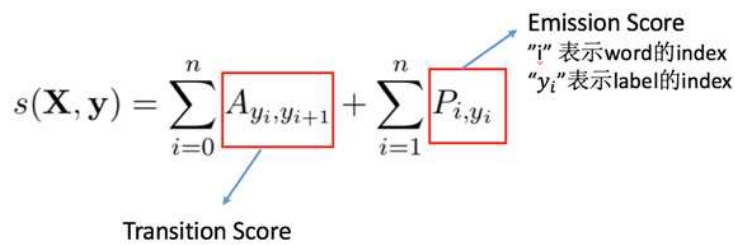

**Emission score**

- 第一个类型的分数是发射分数（状态分数）。这些状态分数来自BiLSTM层的输出。如右图所示，w0被预测为B-Person的分数是1.5。
- 为方便起见，我们给每个类别一个索引，如下表所示：

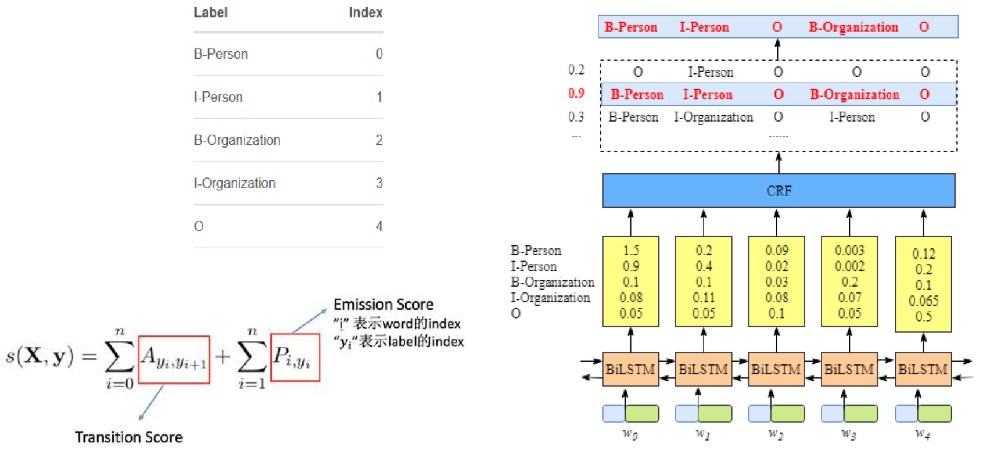

- $P_{i, y_i}$ 代表状态分数，i是单词的位置索引， $y_i$ 是类别的索引。根据上表，
- 表示单词 $w_1$ 被预测为B−Organization的分数是0.1: $P_{i=1,\, y_i=2} = P_{w_i,\ \text{B-Organization}} = 0.1$

**Transition score**

- 我们用 $A_{y_i, y_{i+1}}$ 来表示转移分数。例如，$A_{\text{B-Person}, \text{I-Person}}$ 表示从类别 $\text{B-Person} \rightarrow \text{I-Person}$ 的分数是0.9。因此，我们有一个所有类别间的转移分数矩阵。
- 为了使转移分数矩阵更具鲁棒性，我们加上START 和 END两类标签。START代表一个句子的开始（不是句子的第一个单词），END代表一个句子的结束。

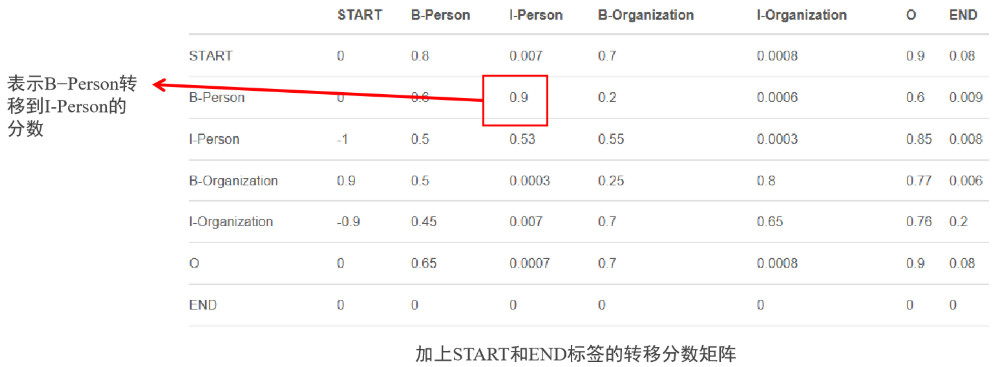

如上表格所示，转移矩阵已经学习到一些有用的约束条件：

- 句子的第一个单词应该是“B-” 或 “O”，而不是“I”。（从“START”->“I-Person 或 I-Organization”的转移分数很低）
- “B-label1 I-label2 I-label3…”，在该模式中，类别1,2,3应该是同一种实体类别。比如，“B-Person I-Person” 是正确的，而“B-Person I-Organization”则是错误的。（“B-Organization” -> “I-Person”的分数很低）
- “O I-label”是错误的，命名实体的开头应该是“B-”而不是“I-”。

要怎样得到这个转移矩阵呢？

- 实际上，转移矩阵是BiLSTM-CRF模型的一个参数。在训练模型之前，你可以随机初始化转移矩阵的分数。这些分数将随着训练的迭代过程被更新，换句话说，CRF层可以自己学到这些约束条件。

**真实路径分数计算**

计算真实路径分数，$e^{S_i}$ ，是非常容易的
- 我们先集中注意力来计算 $S_i$
- 以 "$\text{START} \rightarrow \text{B-Person} \rightarrow \text{I-Person} \rightarrow \text{O} \rightarrow \text{B-Organization} \rightarrow \text{O} \rightarrow \text{END}$" 这条真实路径来说：
    - 句子中有5个单词, $w_1, w_2, w_3, w_4, w_5$ 加上 $\text{START}$ 和 $\text{END}$ 在句子的开始位置和结束位置，记为, $w_0,\; w_6$
    - $S_i = \text{EmissionScore} + \text{TransitionScore}$

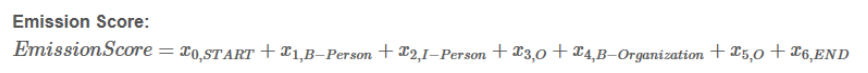

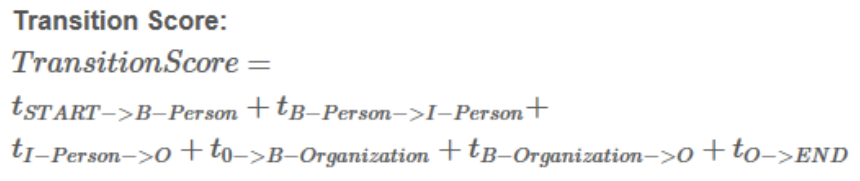

**所有路径的总分计算**

- 这部分是最重要的并且也是比较难的
- 前面我们已经很清楚如何计算真实路径得分，现在我们需要找到一个方法去计算：
- 计算该分值的算法就是HMM中的前向算法，计算所有路径的分值和

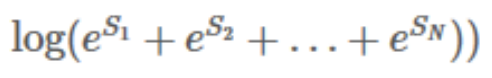

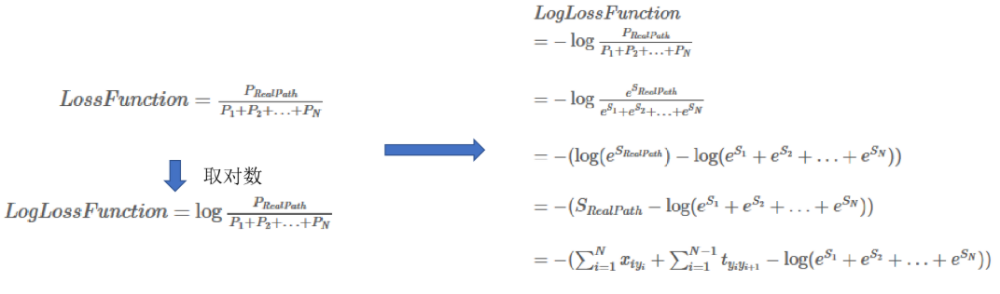

logsumexp计算： 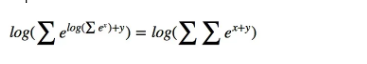

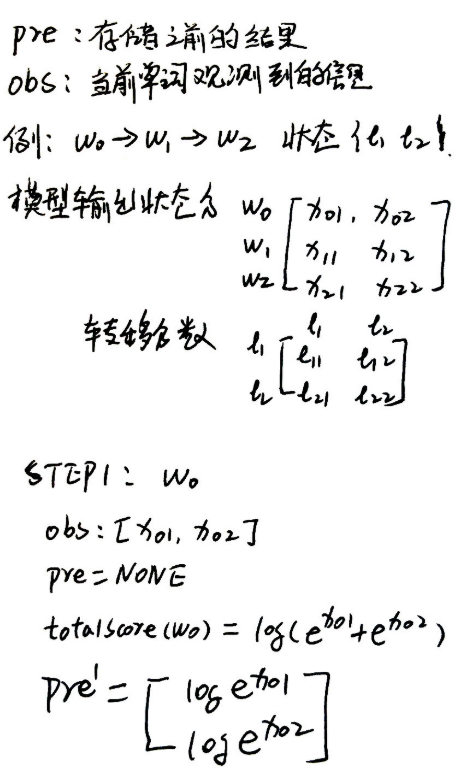

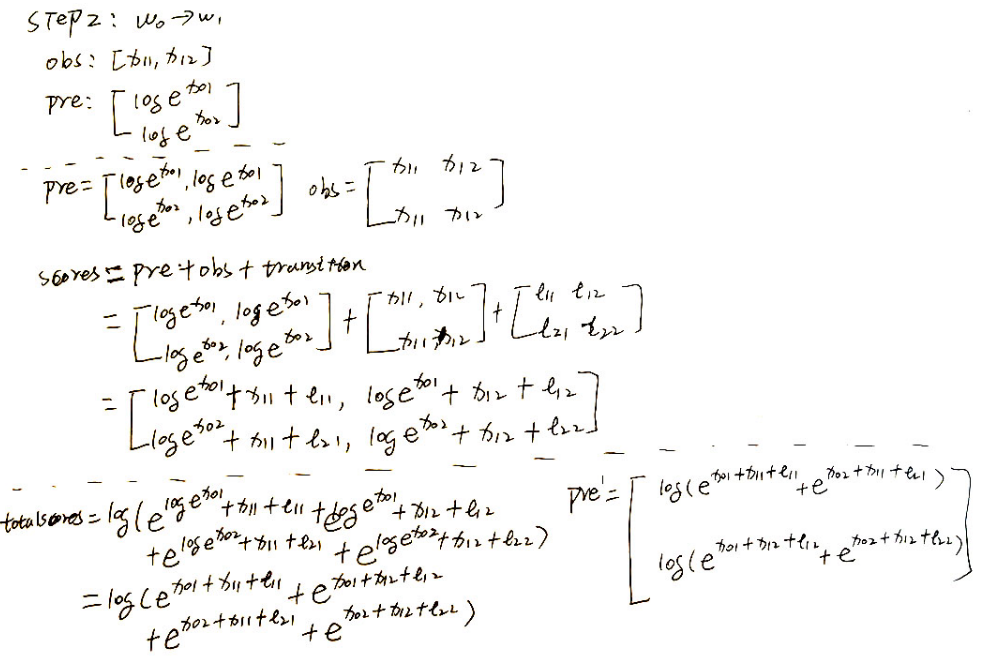

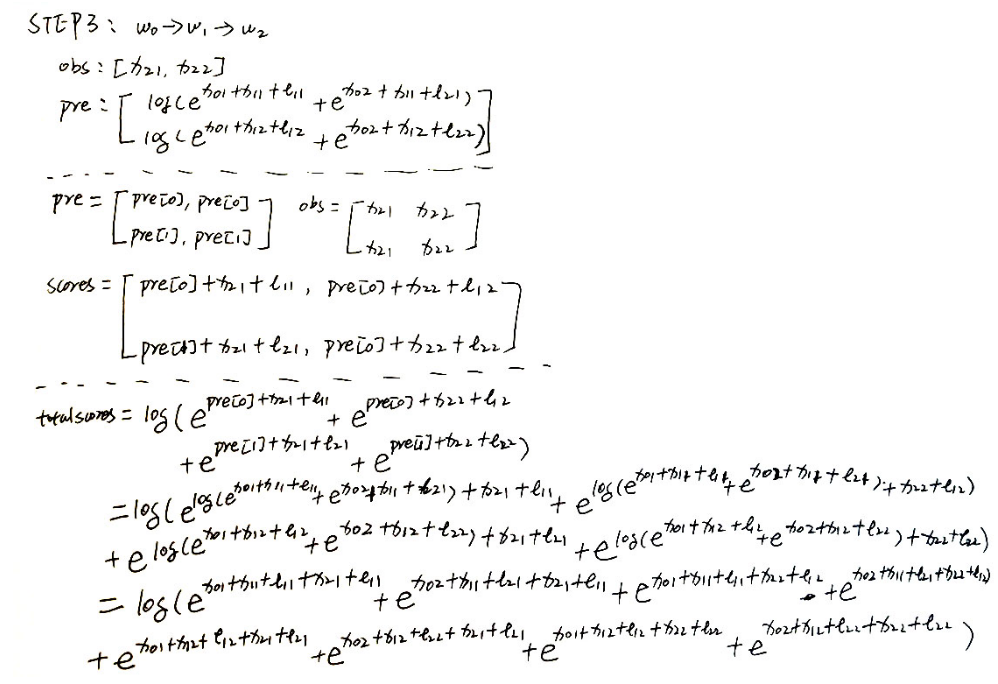

#### 4.3.4 idcnn+CRF
**lstm的缺点**

rnn或者lstm是时序模型，不能并行化，不能重复挖掘gpu的性能。

**普通cnn的缺点**

- 普通的卷积，3个3*3卷积叠加，stride为1的话，能达到：(kernel-1)*lay+1=7的感受野，这样对于序列标注这种密集预测型的任务来讲，卷积之后，末层神经元可能只是得到了原始输入数据中一小块的信息。为了覆盖到输入的全部信息就需要加入更多的卷积层， 导致层数越来越深，参数越来越多，而为了防止过拟合又要加入更多的Dropout之类的正则化，带来更多的超参数，整个模型变得庞大和难以训练。
- 普通的卷积还有池化操作会造成信息损失，对于序列标注这种任务不合适

**dilated CNN膨胀卷积**

- dilated CNN为filter增加了一个dilation width，作用在输入矩阵的时候，会skip掉所有dilation width中间的输入数据；而filter矩阵本身的大小仍然不变，这样filter获取到了更广阔的输入矩阵上的数据，看上去就像是“膨胀”了一般。

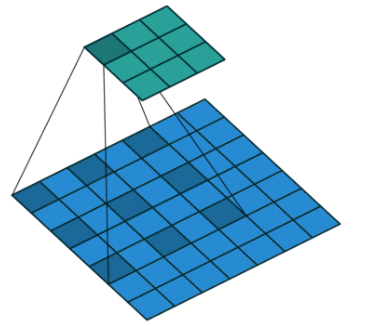  
dilated CNN可以增大感受野

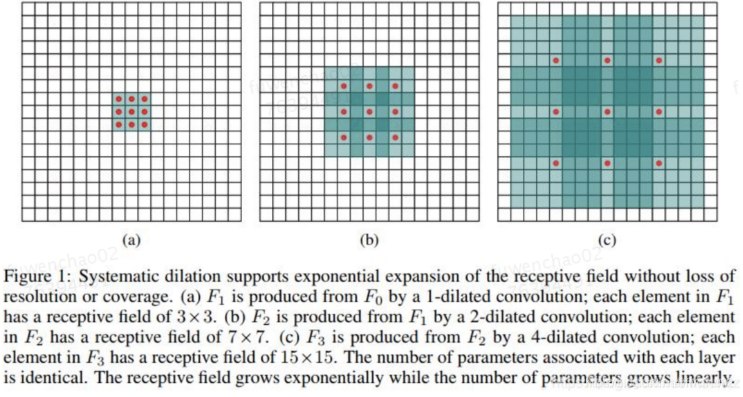
- 一般的卷积网络也可以来尝试序列标注任务，但是卷积网络的特性决定它只能观察到N-gram的信息，无法考虑更远的上下文信息。而膨胀卷积在保持参数个数不变的情况下增大了卷积核的感受野，同时它可以保证输出的特征映射（feature map）的大小保持不变。其中，亮黄色卷积核在最右边的膨胀卷积的视野为“法-工-程-师-职”，在中间的卷积网络需要再增加一层，才有5个字符的视野，但这样参数就变多了。同时，改善了卷积网络在提取序列特征时只能考虑局部窄视野的缺陷。

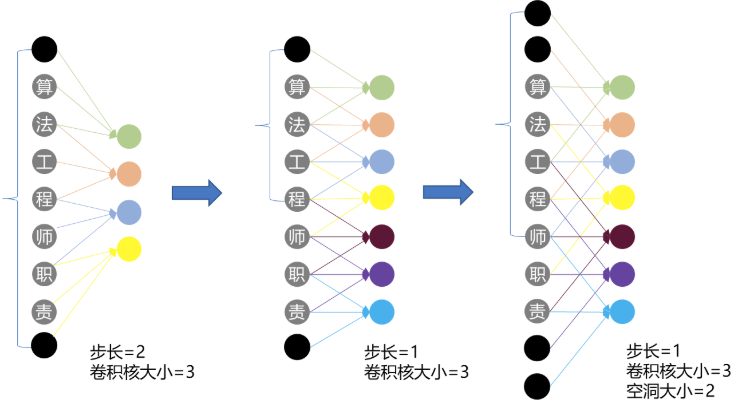  
膨胀卷积和普通卷积感受野对比

**IDCNN(Iterated Dilated CNN)**

- 模型是4个大的相同结构的Dilated CNN block拼在一起，每个block里面是dilation width为1, 1, 2的三层Dilated卷积层，所以叫做 Iterated Dilated CNN。
- IDCNN对输入句子的每一个字生成一个logits，这里就跟biLSTM模型输出的logits完全一样，送入CRF Layer。
- 就是使用IDCNN替代biLSTM

#### 4.3.5 改进思路
**引入更多特征**

- 引入分词标记的信息能够大幅提升模型表现
- 引入字符的bi-gram信息也是不错的补充信息
- 引入汉字的拼音特征
- 引入汉字的偏旁部首
- 引入bert等动态词向量

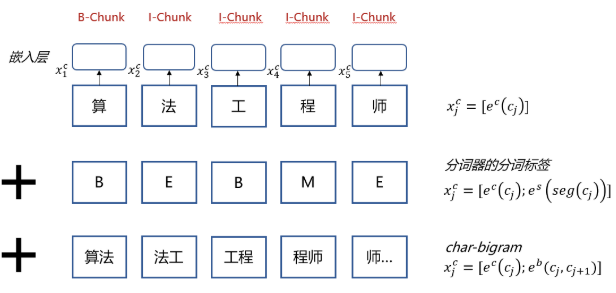  
分词特征

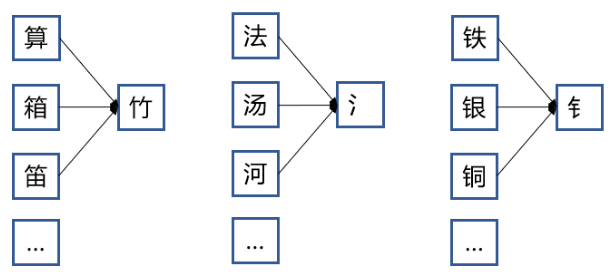  
偏旁部首

### 4.4 嵌套实体问题
#### 4.4.1 复杂实体问题

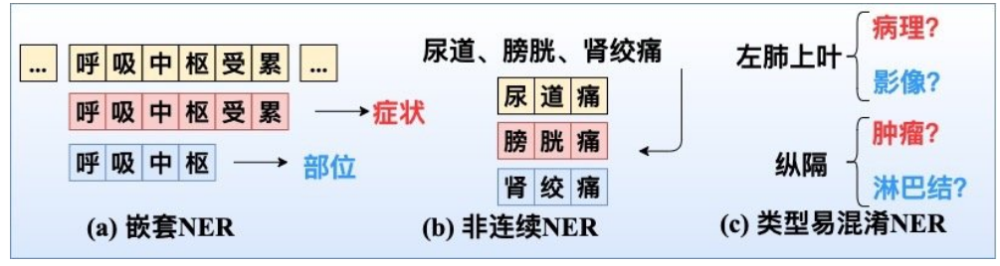

#### 4.4.2 如何解决嵌套实体问题
**序列标注**

- 多标签分类。如下图（a）所示，将多分类转化为多标签分类，即使用sigmoid设定阈值进行解码；这种方式的学习难度较大，也会容易导致label之间依赖关系的缺失；
- 合并标签层。如下图（b）所示，依然采用CRF，但设置多个标签层，对于每一个token给出其所有的label，然后将所有标签层合并。这种方式指数级增加了标签，对于多层嵌套，稀疏问题较为棘手；

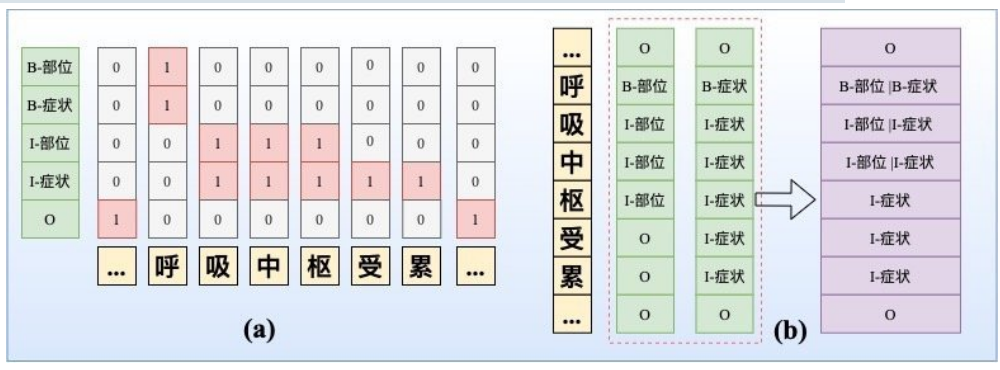

**指针标注**

- 层叠式指针标注：即设置C个指针网络，如下图（c）所示。
- MRC-QA+指针标注：构建query问题指代所要抽取的实体类型，同时也引入了先验语义知识，如下图（d）所示。在文献中就对不同实体类型构建query，并采取指针标注，此外也构建了单层指针矩阵来判断span是否构成一个实体mention。

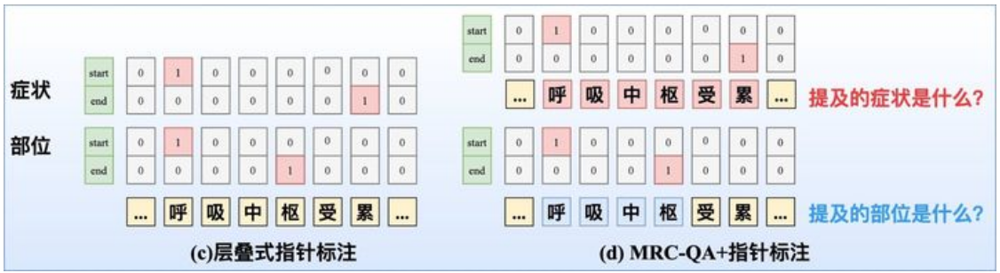

**多头标注**

- 构建一个Span矩阵，如下图（e）所示，Span{呼}{枢}=1，代表「呼吸中枢」是一个部位实体；Span{呼}{累}=2，代表「呼吸中枢受累」是一个症状实体；对于多头标注的一个重点就是如何构造Span矩阵、以及解决0-1标签稀疏问题。
- 嵌套实体的2篇SOTA之作： ACL20的《Named Entity Recognition as Dependency Parsing》采取Biaffine机制构造Span矩阵；EMNLP20的HIT[4]则通过Biaffine机制专门捕获边界信息，并采取传统的序列标注任务强化嵌套结构的内部信息交互，同时采取focal loss来解决0-1标签不平衡问题。

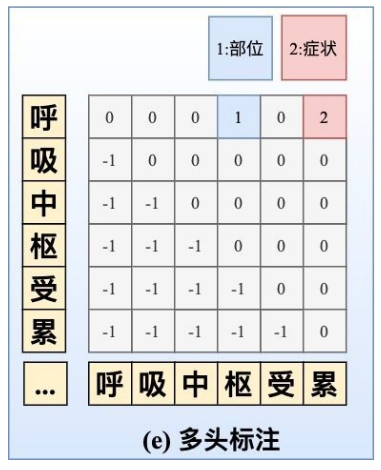

**效果**

- 在CHIP20嵌套实体评测中，对比了不同标注策略下的效果（如下图），可以发现：多头标注效果最佳！

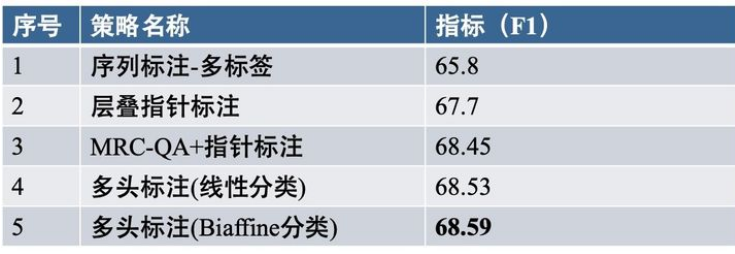